In [52]:
library(Seurat)
library(dplyr)

In [349]:
data = readRDS('/tmp/work/Visium/zenodo.11468564/scRNA_data/panB_scRNA_processed_data.rds')

In [350]:
my36colors <-c('#E5D2DD', '#53A85F', '#F1BB72', '#F3B1A0', '#D6E7A3', '#57C3F3', '#476D87',
               '#E95C59', '#E59CC4', '#AB3282', '#23452F', '#BD956A', '#8C549C', '#585658',
               '#9FA3A8', '#E0D4CA', '#5F3D69', '#C5DEBA', '#58A4C3', '#E4C755', '#F7F398',
               '#AA9A59', '#E63863', '#E39A35', '#C1E6F3', '#6778AE', '#91D0BE', '#B53E2B',
               '#712820', '#DCC1DD', '#CCE0F5',  '#CCC9E6', '#625D9E', '#68A180', '#3A6963',
               '#968175'
)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



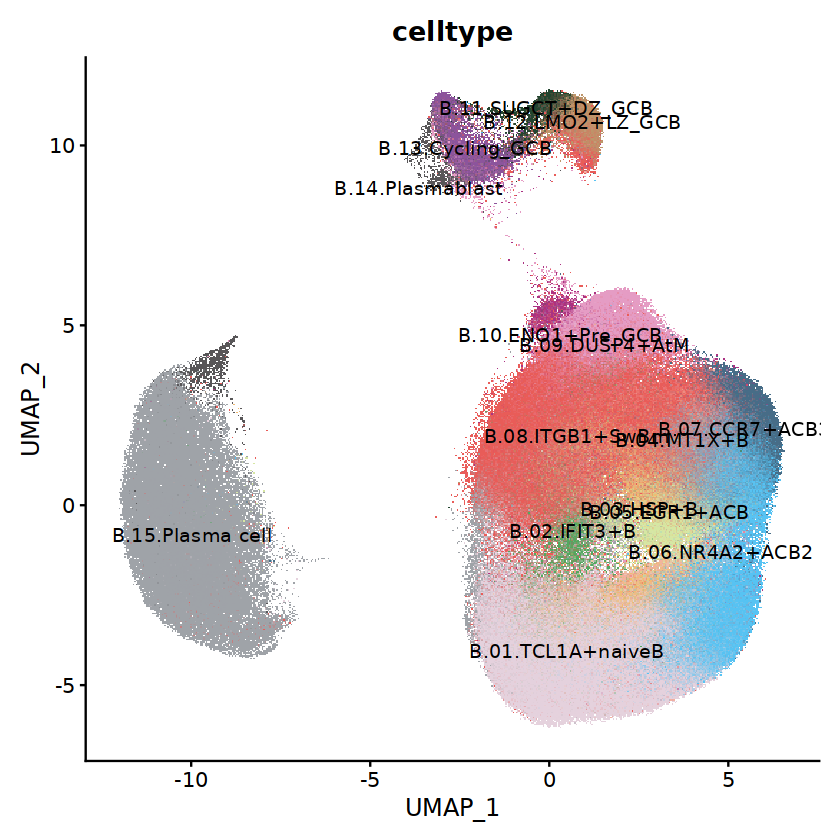

In [286]:
DimPlot(data,group.by = "celltype",label=T, cols = my36colors) + NoLegend()

In [287]:
calculate_cosine_similarity <- function(matrix, vector) {
  
  # Normalize the vector
  vector_norm <- sqrt(sum(vector^2))
  vector_normalized <- vector / vector_norm
  
  # Initialize a vector to store cosine similarities for each column
  cosine_similarities <- numeric(ncol(matrix))
  
  # Loop through each column in the matrix and calculate cosine similarity
  for (i in 1:ncol(matrix)) {
    
    # Get the column
    column <- matrix[, i]
    
    # Normalize the column
    column_norm <- sqrt(sum(column^2))
    column_normalized <- column / column_norm
    
    # Calculate cosine similarity as dot product of normalized vectors
    cosine_similarities[i] <- sum(column_normalized * vector_normalized)
  }
  
  return(cosine_similarities)
}

In [288]:
## subset the b cell data set
unique_celltypes <- unique(data[[]]$celltype)
b_cell_types_only <- unique_celltypes[c(1:9,12,13)]
b_ref <- subset(data, subset = celltype %in% b_cell_types_only)

## select the highly variable features
b_ref <- FindVariableFeatures(b_ref, selection.method = "vst", nfeatures = 2000)
b_features <- VariableFeatures(b_ref)

## generate a psuedobulk dataframe where the rows are the HVGs and the columns are cell type
pseudo_b_ref <- AggregateExpression(b_ref, features = b_features, assays = "RNA", return.seurat = T, group.by = "celltype")
b_ref_matrix <- GetAssayData(pseudo_b_ref, assay = "RNA", slot = "scale.data")

## import the seurat processed data
visium_samples <- readRDS('/tmp/work/Visium/BRCA_2024/objects/seurat_objects.rds')
visium_matrix <- GetAssayData(visium_merge, assay = "SCT", slot = "scale.data")
overlapping_genes <- intersect(rownames(visium_matrix),rownames(b_ref_matrix))
print(length(overlapping_genes))  # will need to expand the number genes for the SCT transformation

## subset the matrices
visium_matrix_overlap <- visium_matrix[overlapping_genes,]
b_ref_matrix_overlap <- b_ref_matrix[overlapping_genes,]

dn_b <- b_ref_matrix_overlap[,'B.09.DUSP4+AtM'] 
naive_b <- b_ref_matrix_overlap[,'B.01.TCL1A+naiveB'] 
just_b <- b_ref_matrix_overlap[,'B.02.IFIT3+B'] 


## calculate cosine similarity for each location and add it to the seurat objects
dn_b_cell_cos <- calculate_cosine_similarity(visium_matrix_overlap,dn_b)
naive_b_cell_cos <- calculate_cosine_similarity(visium_matrix_overlap,naive_b)
just_b_cell_cos <- calculate_cosine_similarity(visium_matrix_overlap,just_b)

visium_merge$dn_b_cos <- dn_b_cell_cos
visium_merge$naive_b_cell_cos <- naive_b_cell_cos
visium_merge$just_b_cell_cos <- just_b_cell_cos

## subset the b cell locations

## plot the cosine similarity scores for pre and post for all b cell types

Centering and scaling data matrix



[1] 880


Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


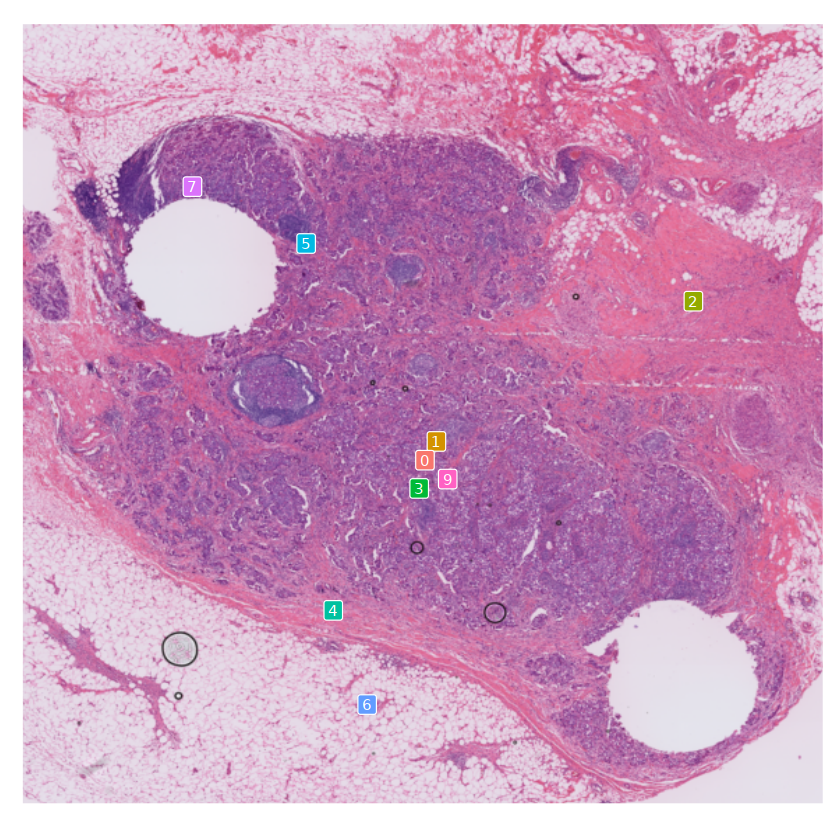

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


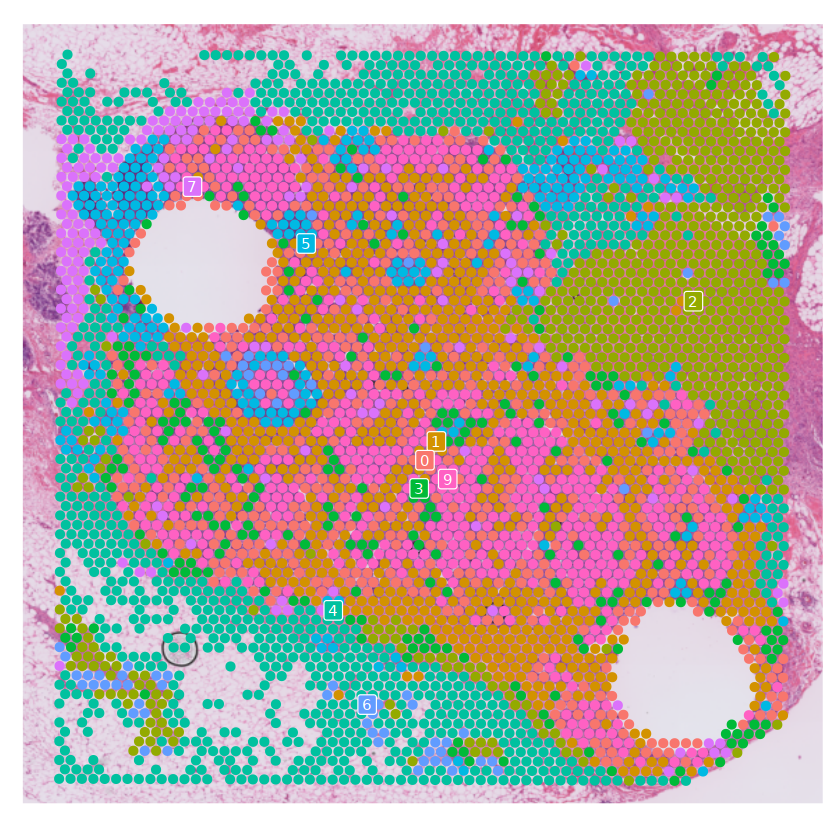

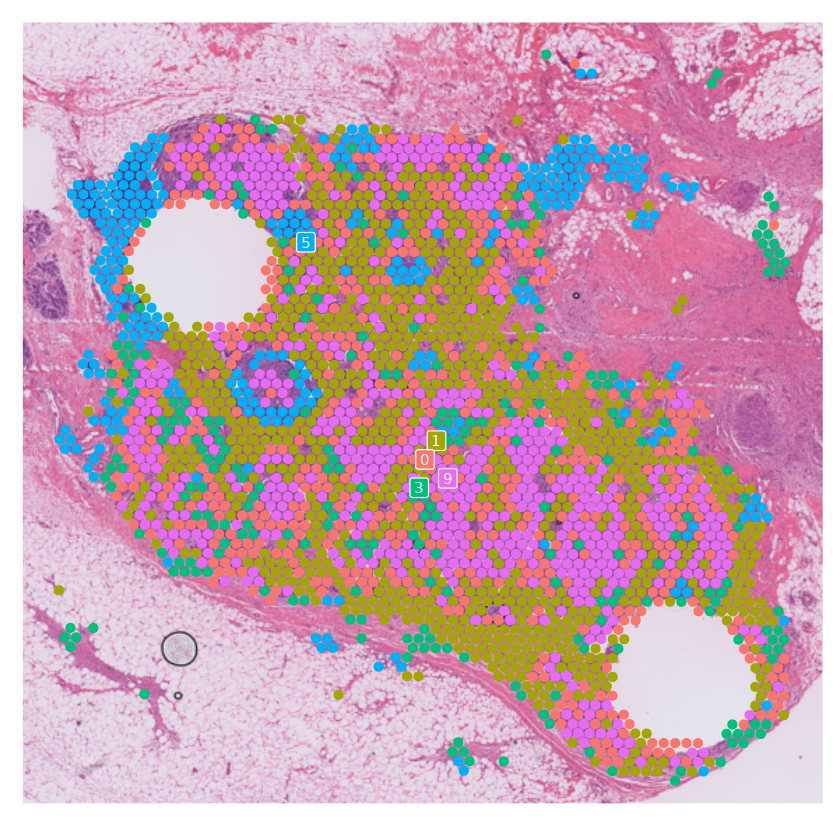

In [322]:
options(warn = -1)

current_slices = 'slice1'
SpatialDimPlot(visium_merge, label = TRUE, label.size = 3, images = current_slices, group.by = 'seurat_clusters', alpha = 0) + NoLegend()
SpatialDimPlot(visium_merge, label = TRUE, label.size = 3, images = current_slices, group.by = 'seurat_clusters', alpha = 1) + NoLegend()

tumor_clusters <- c(0,1,3,5,8,9,10,11)
visium_merge_tumor <- subset(visium_merge, subset = seurat_clusters %in% tumor_clusters)

SpatialDimPlot(visium_merge_tumor, label = TRUE, label.size = 3, images = current_slices, group.by = 'seurat_clusters', alpha = 1) + NoLegend()

Picking joint bandwidth of 0.0125

Picking joint bandwidth of 0.00988



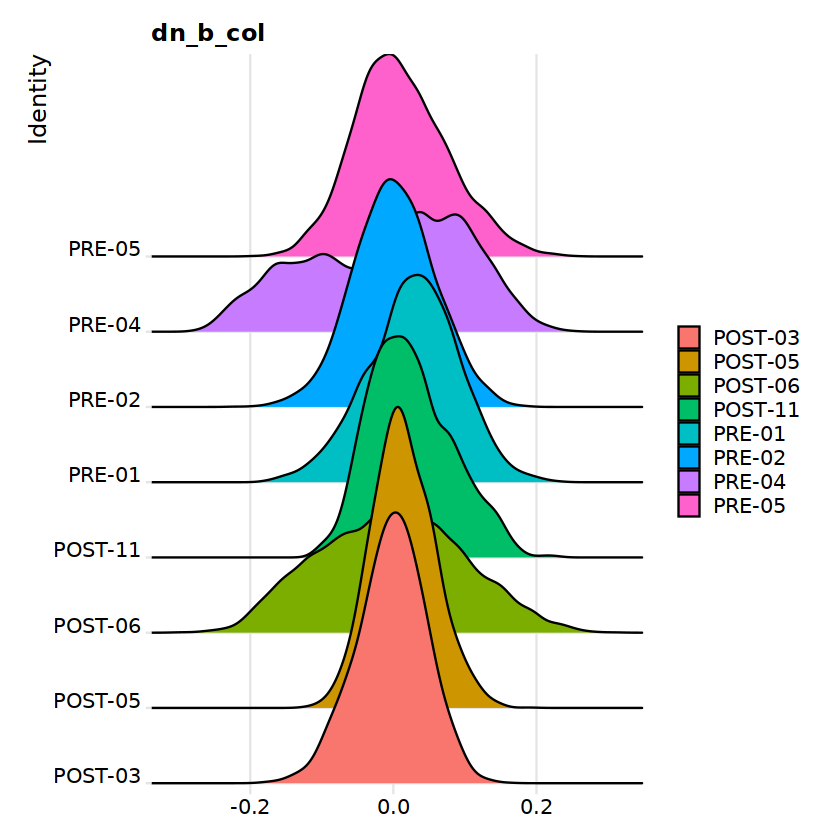

Picking joint bandwidth of 0.0199



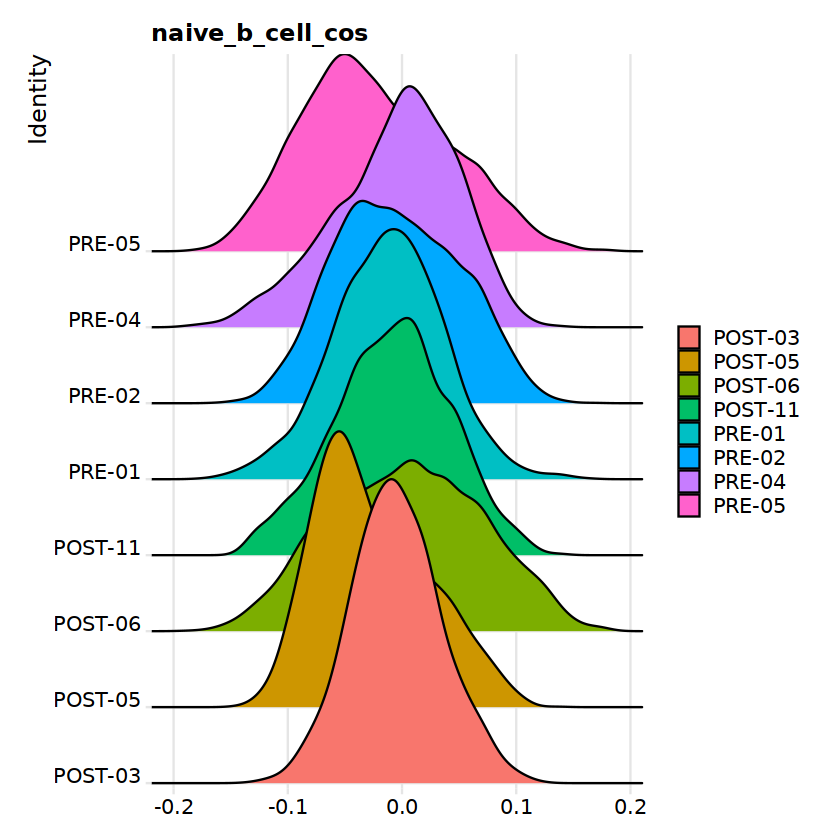

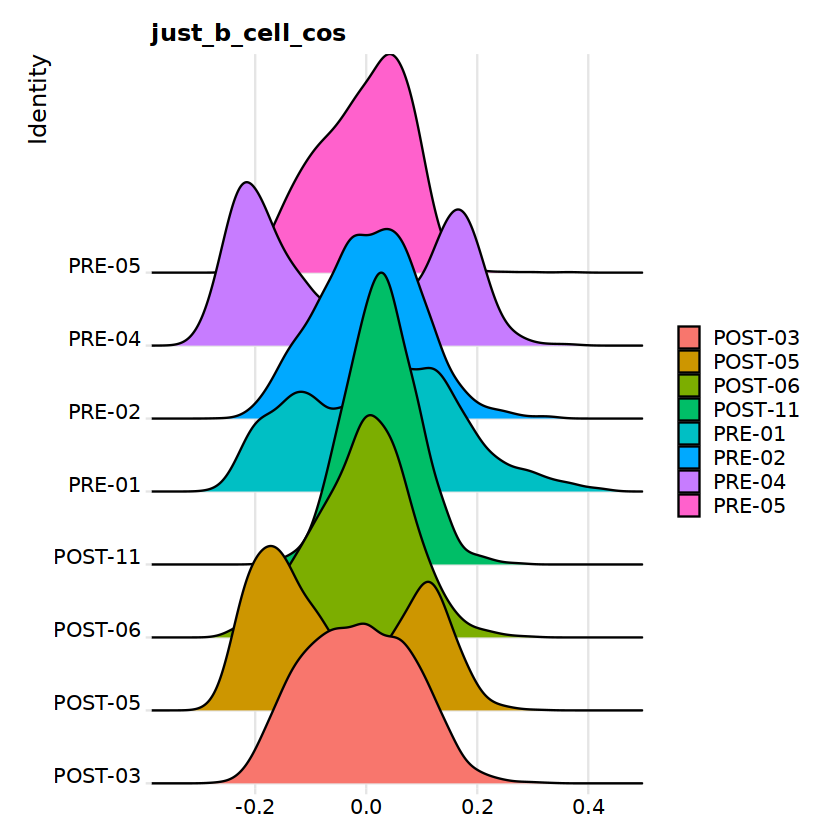

In [324]:
RidgePlot(visium_merge_tumor, features = 'dn_b_col', group.by = 'sample')
RidgePlot(visium_merge_tumor, features = 'naive_b_cell_cos', group.by = 'sample')
RidgePlot(visium_merge_tumor, features = 'just_b_cell_cos', group.by = 'sample')

In [335]:
pre <- subset(visium_merge, subset = sample %in% c('PRE-01','PRE-02','POST-06','POST-11'))
post <- subset(visium_merge, subset = sample %in% c('POST-03','POST-05','POST-06','POST-11'))

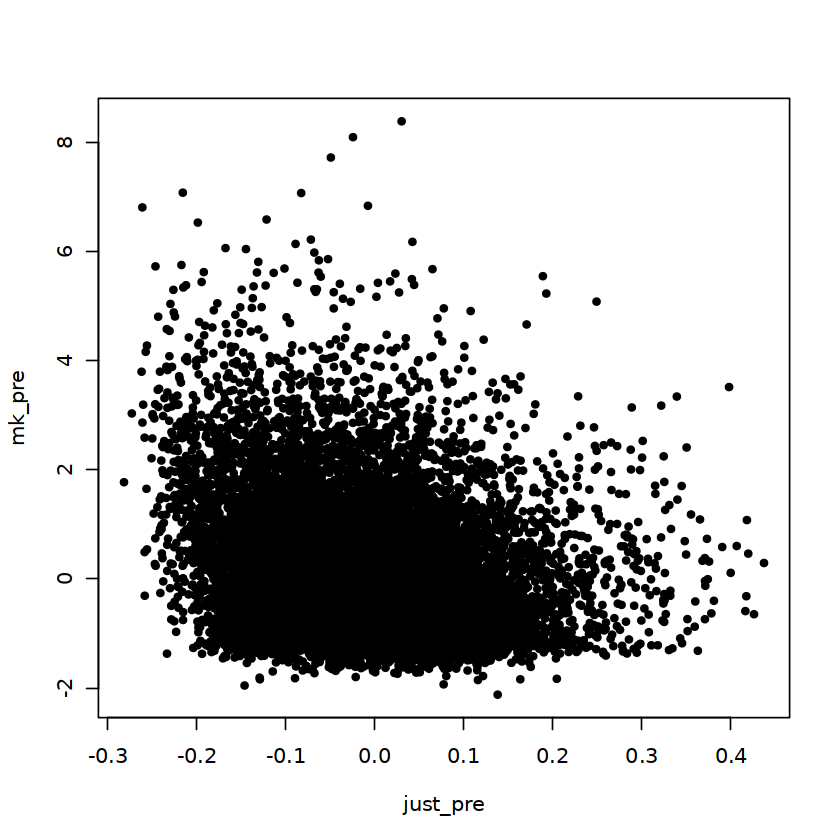

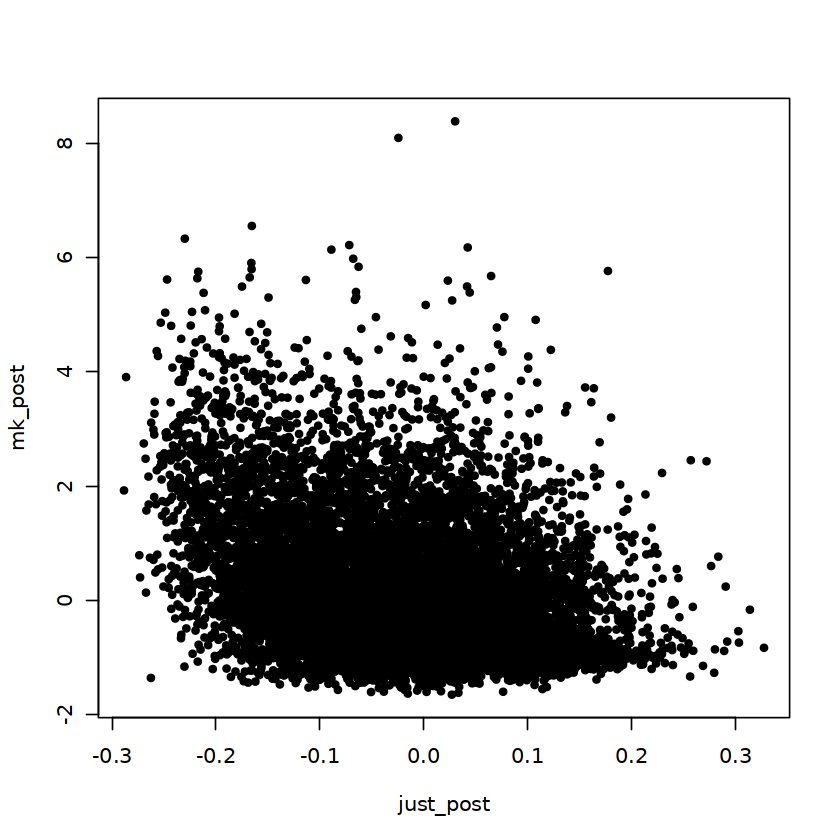

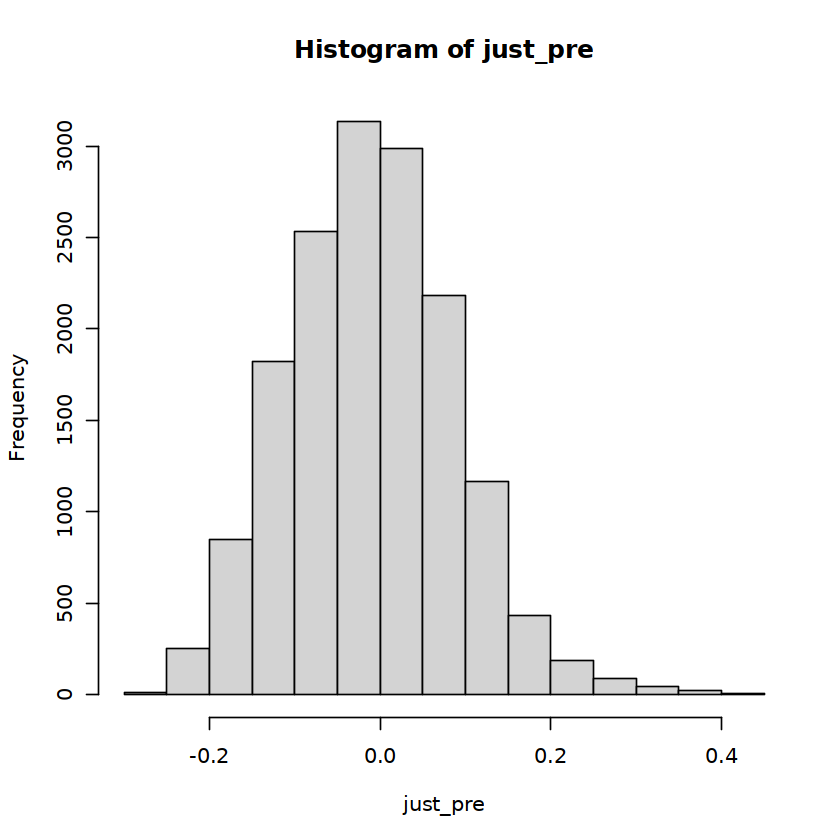

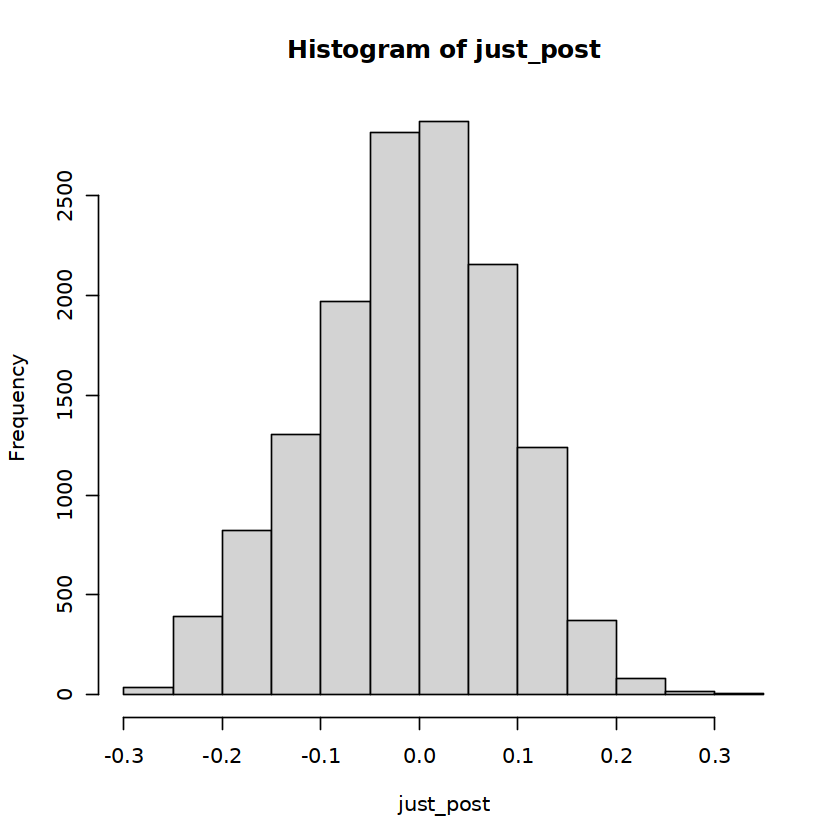

In [336]:
pre_matrix <- GetAssayData(pre, assay = "SCT", slot = "scale.data")
post_matrix <- GetAssayData(post, assay = "SCT", slot = "scale.data")

just_pre <- pre[[]]$just_b_cell_cos
mk_pre <- pre_matrix['MKI67',]

just_post <- post[[]]$just_b_cell_cos
mk_post <- post_matrix['MKI67',]

plot(just_pre,mk_pre, pch=20)

plot(just_post,mk_post, pch=20)

hist(just_pre, bins = 100)
hist(just_post, bins = 100)

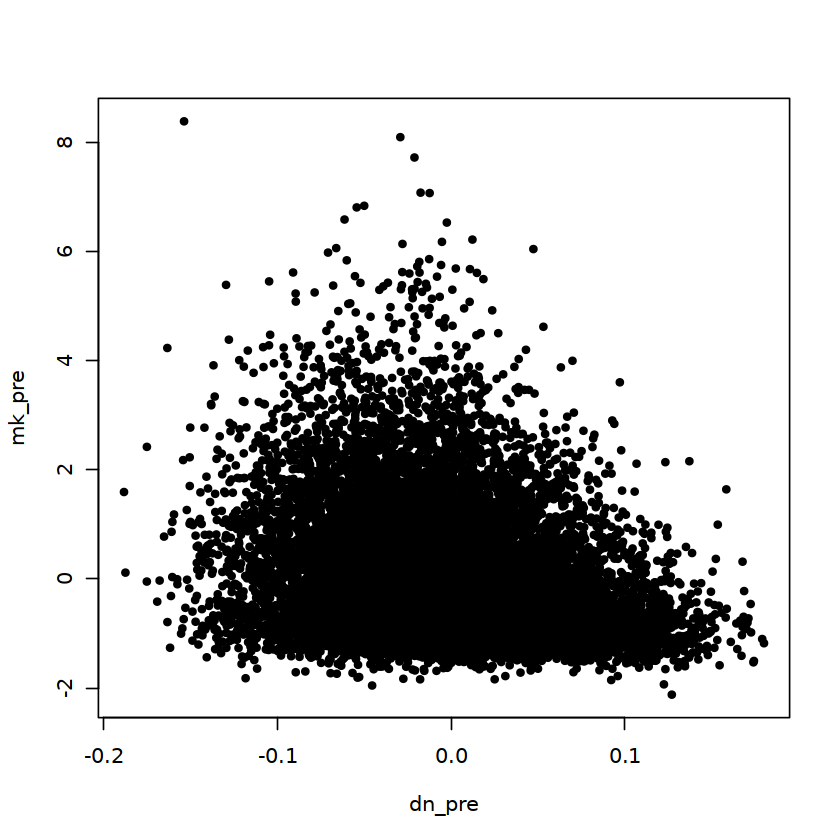

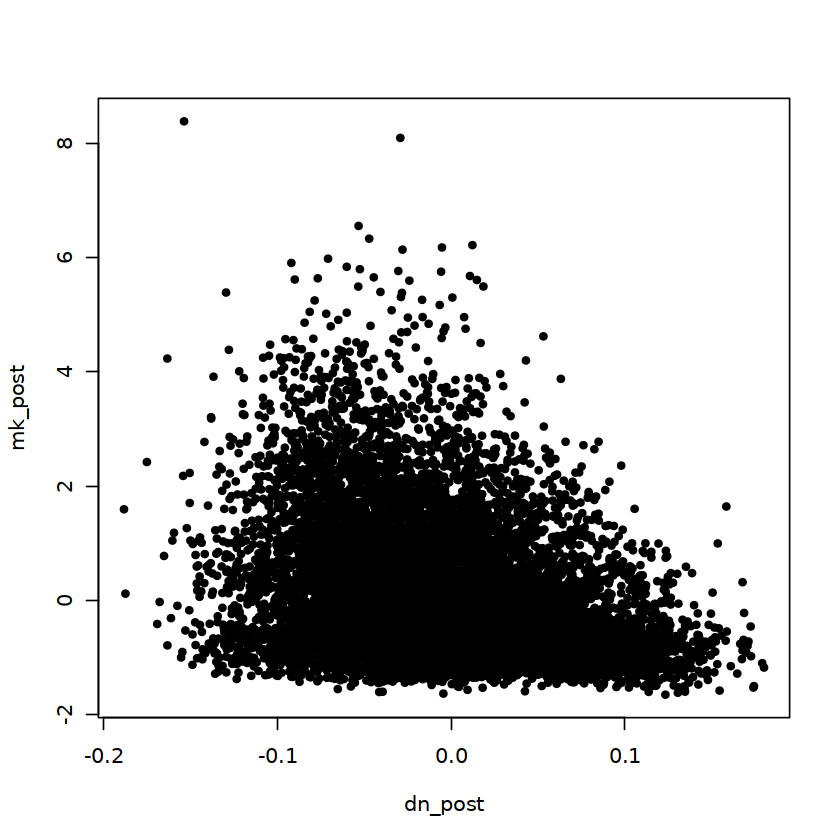

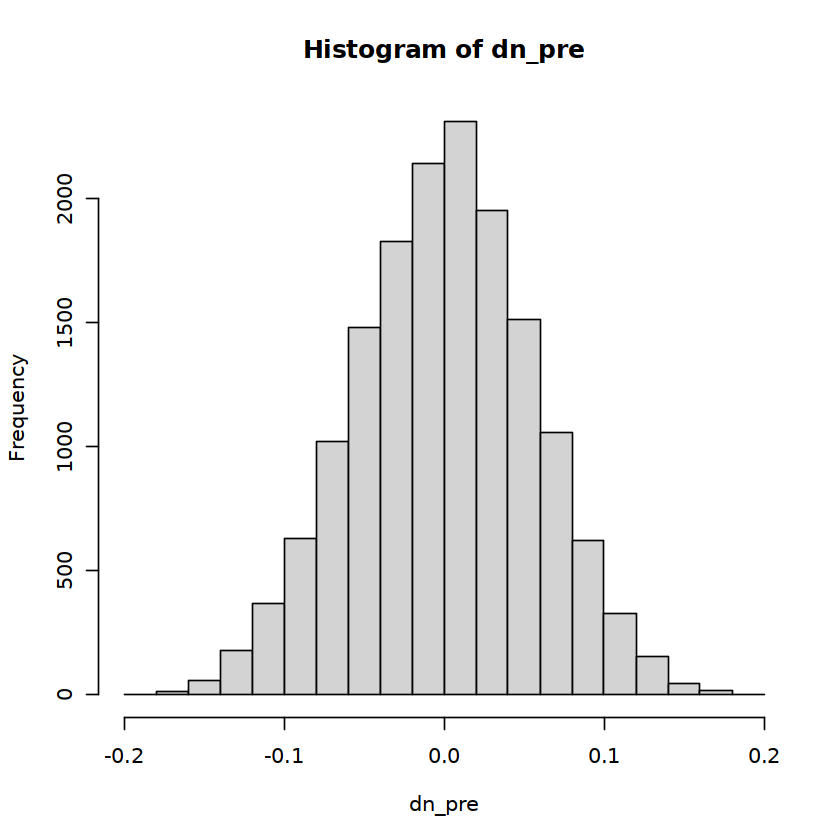

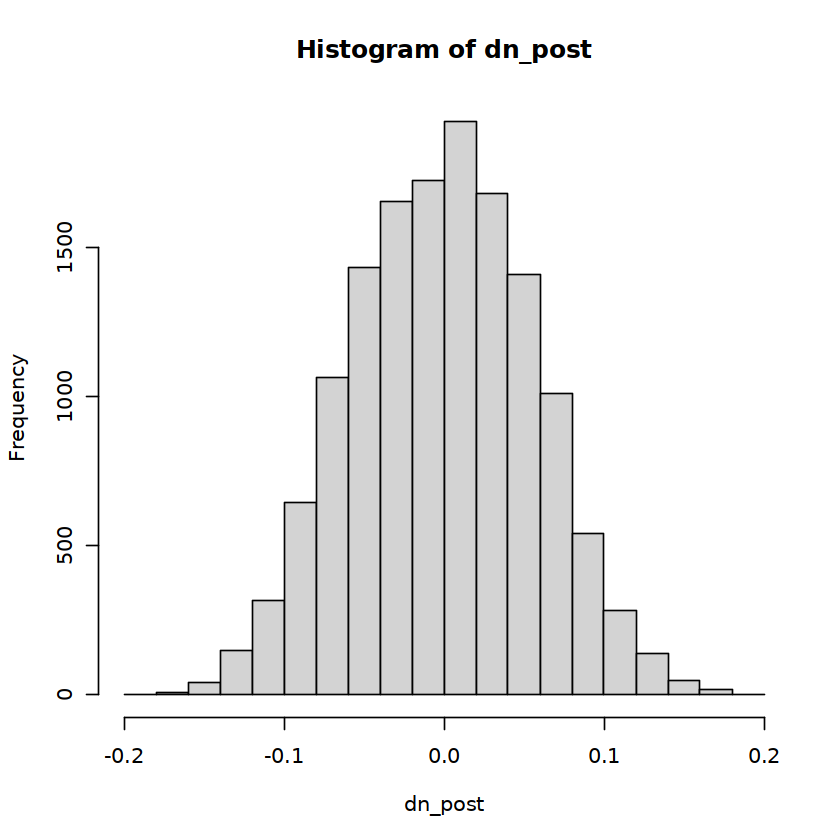

In [337]:
pre_matrix <- GetAssayData(pre, assay = "SCT", slot = "scale.data")
post_matrix <- GetAssayData(post, assay = "SCT", slot = "scale.data")


dn_pre <- pre[[]]$naive_b_cell_cos
mk_pre <- pre_matrix['MKI67',]

dn_post <- post[[]]$naive_b_cell_cos
mk_post <- post_matrix['MKI67',]

plot(dn_pre,mk_pre, pch=20)

plot(dn_post,mk_post, pch=20)

hist(dn_pre, bins = 100)
hist(dn_post, bins = 100)

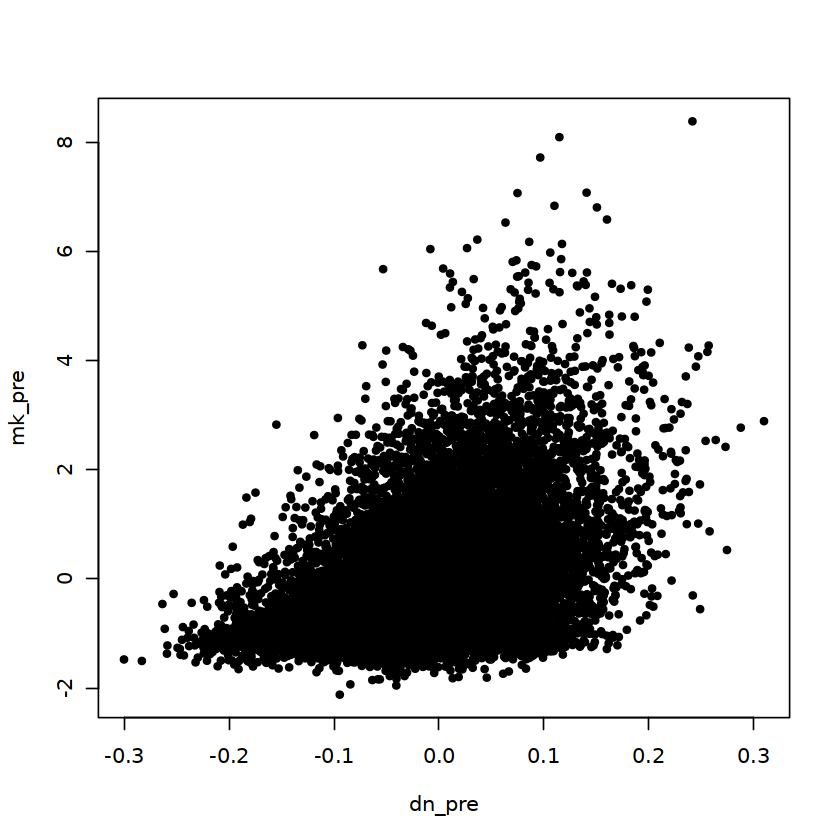

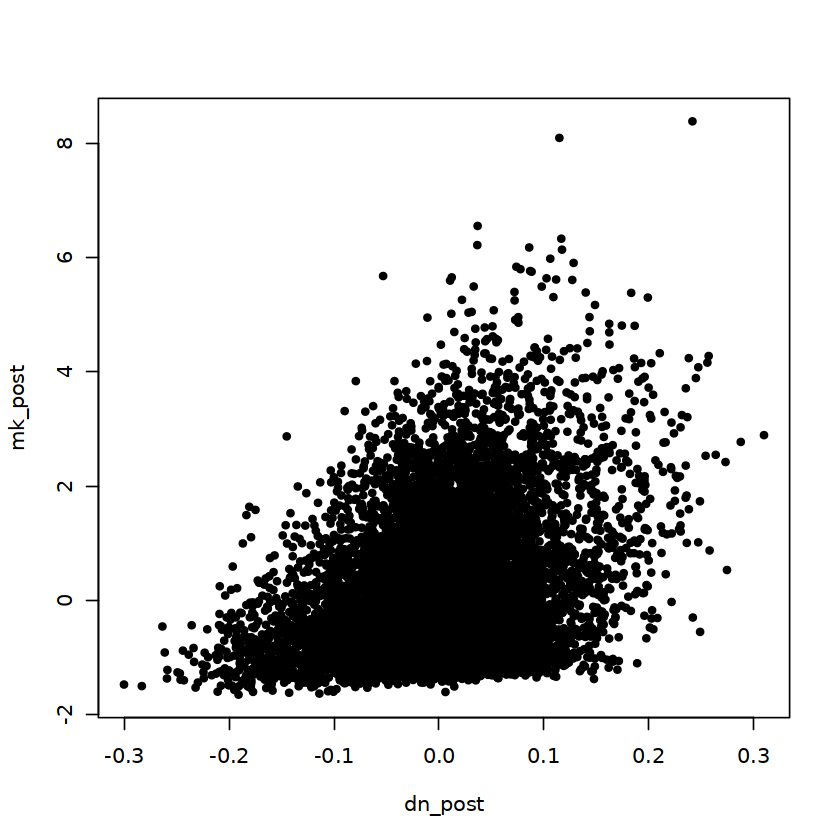

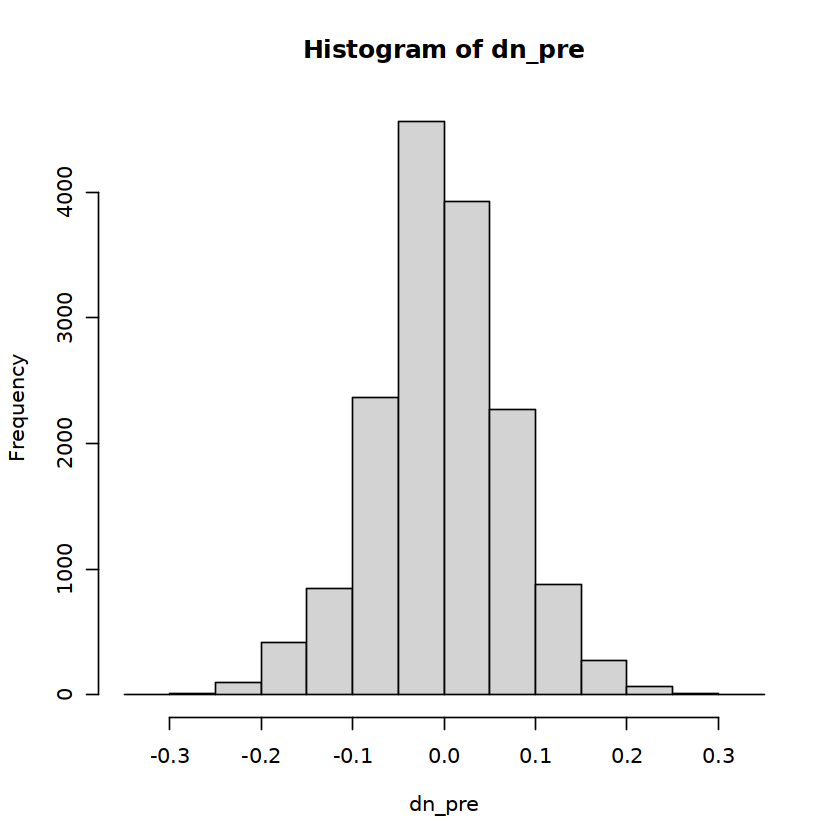

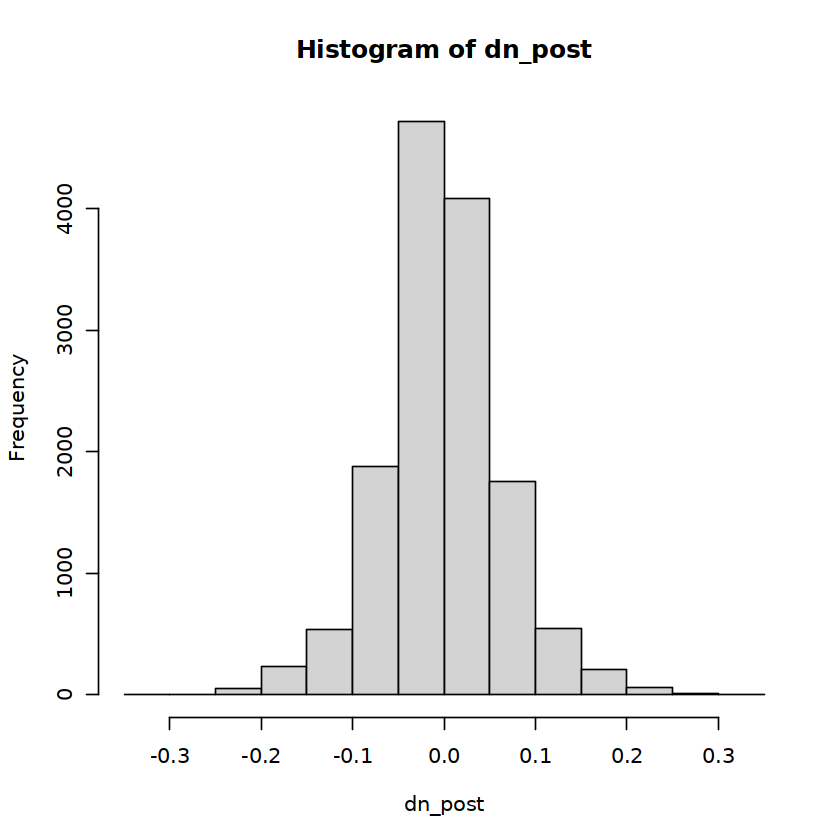

In [340]:
pre_matrix <- GetAssayData(pre, assay = "SCT", slot = "scale.data")
post_matrix <- GetAssayData(post, assay = "SCT", slot = "scale.data")


dn_pre <- pre[[]]$dn_b_col
mk_pre <- pre_matrix['MKI67',]

dn_post <- post[[]]$dn_b_col
mk_post <- post_matrix['MKI67',]

plot(dn_pre,mk_pre, pch=20)

plot(dn_post,mk_post, pch=20)

hist(dn_pre, bins = 100)
hist(dn_post, bins = 100)

`geom_smooth()` using formula = 'y ~ x'


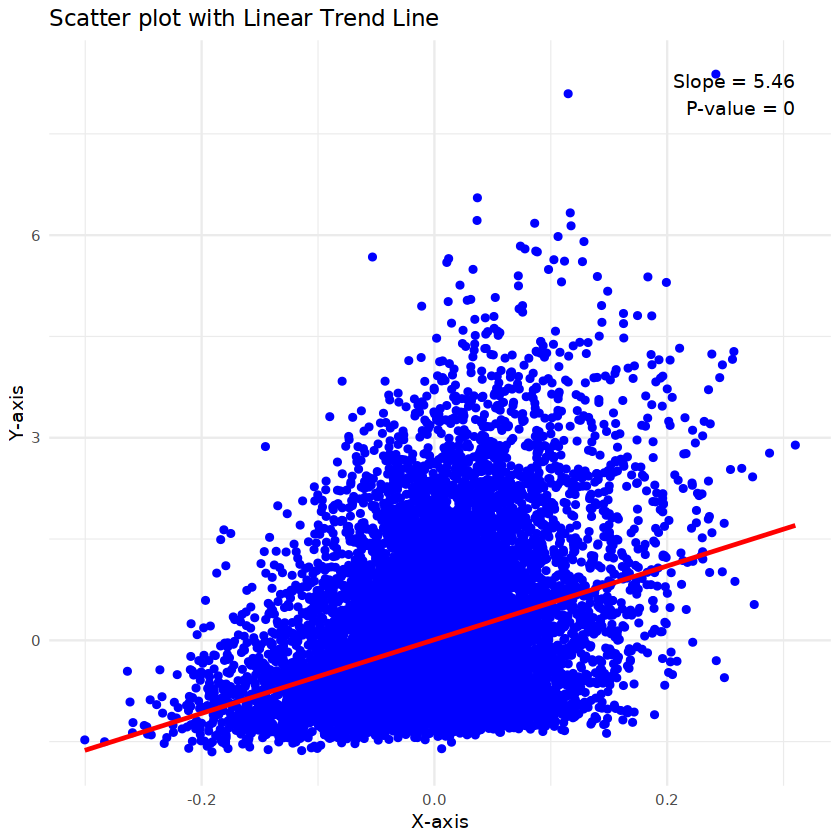

In [341]:
# Create a data frame for ggplot
data <- data.frame(dn_post, mk_post)

# Fit the linear model
model <- lm(mk_post ~ dn_post, data = data)

# Extract the slope (coefficient for dn_pre)
slope <- coef(model)[2]

# Extract the p-value for the slope
summary_model <- summary(model)
p_value <- summary_model$coefficients[2, 4]

# Plot with the slope and p-value annotated
ggplot(data, aes(x = dn_post, y = mk_post)) +
  geom_point(color = "blue") +  # Scatter plot
  geom_smooth(method = "lm", se = FALSE, color = "red") +  # Linear trend line
  labs(title = "Scatter plot with Linear Trend Line",
       x = "X-axis",
       y = "Y-axis") +
  # Annotate the slope and p-value on the plot
  annotate("text", x = max(data$dn_post), y = max(data$mk_post), 
           label = paste0("Slope = ", round(slope, 2), 
                          "\nP-value = ", signif(p_value, 3)),
           hjust = 1, vjust = 1, color = "black") +
  theme_minimal()

`geom_smooth()` using formula = 'y ~ x'


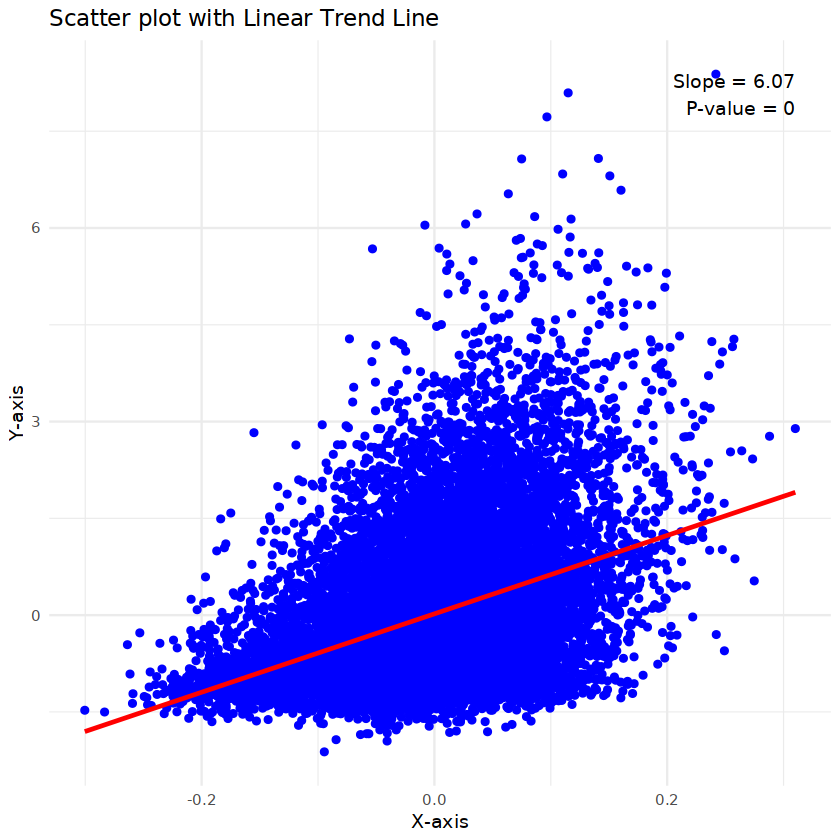

In [342]:
# Create a data frame for ggplot
data <- data.frame(dn_pre, mk_pre)

# Fit the linear model
model <- lm(mk_pre ~ dn_pre, data = data)

# Extract the slope (coefficient for dn_pre)
slope <- coef(model)[2]

# Extract the p-value for the slope
summary_model <- summary(model)
p_value <- summary_model$coefficients[2, 4]

# Plot with the slope and p-value annotated
ggplot(data, aes(x = dn_pre, y = mk_pre)) +
  geom_point(color = "blue") +  # Scatter plot
  geom_smooth(method = "lm", se = FALSE, color = "red") +  # Linear trend line
  labs(title = "Scatter plot with Linear Trend Line",
       x = "X-axis",
       y = "Y-axis") +
  # Annotate the slope and p-value on the plot
  annotate("text", x = max(data$dn_pre), y = max(data$mk_pre), 
           label = paste0("Slope = ", round(slope, 2), 
                          "\nP-value = ", signif(p_value, 3)),
           hjust = 1, vjust = 1, color = "black") +
  theme_minimal()

In [332]:
model <- lm(mk_pre ~ dn_pre)
# summary(model)
cf <- coef(model)
print('pre')
print(cf[1])
print(cf[2])

model <- lm(mk_post ~ dn_post)
# summary(model)
cf <- coef(model)
print('post')
print(cf[1])
print(cf[2])

[1] "pre"
(Intercept) 
 0.08520736 
  dn_pre 
5.854192 
[1] "post"
(Intercept) 
  0.1580395 
 dn_post 
5.446557 


In [343]:
# SpatialFeaturePlot(visium_merge, features = 'dn_b_col')
# SpatialFeaturePlot(visium_merge, features = 'naive_b_cell_cos')
# SpatialFeaturePlot(visium_merge, features = 'just_b_cell_cos')

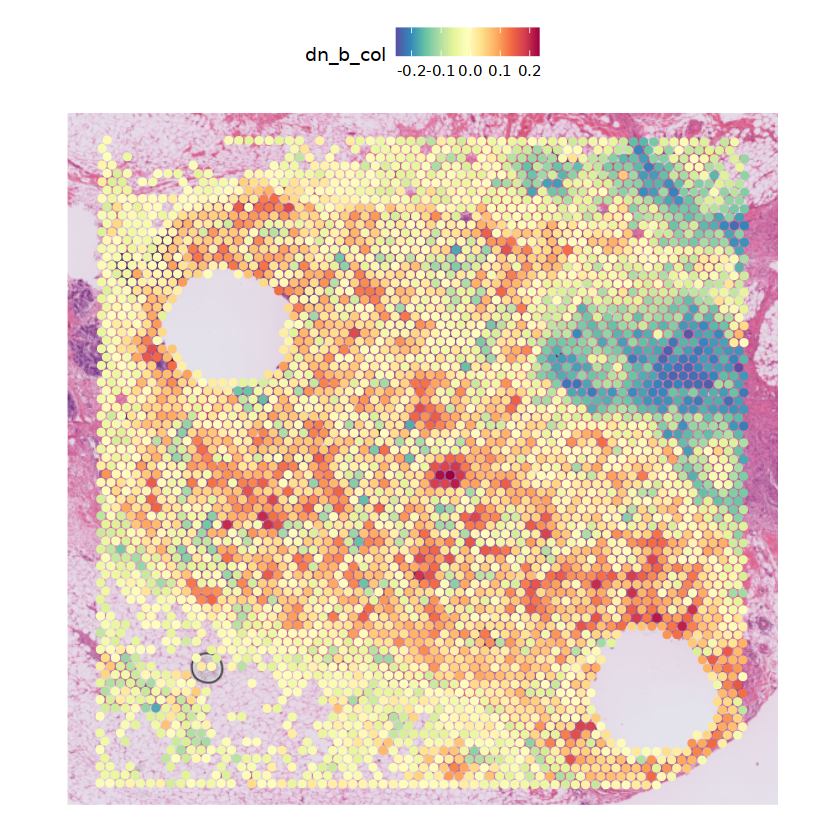

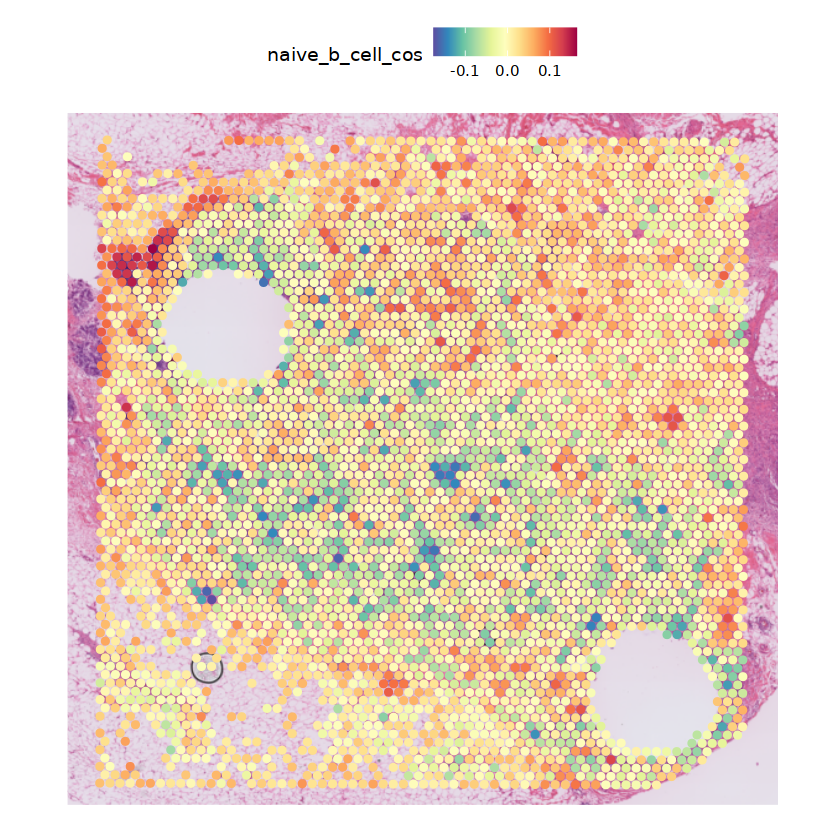

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


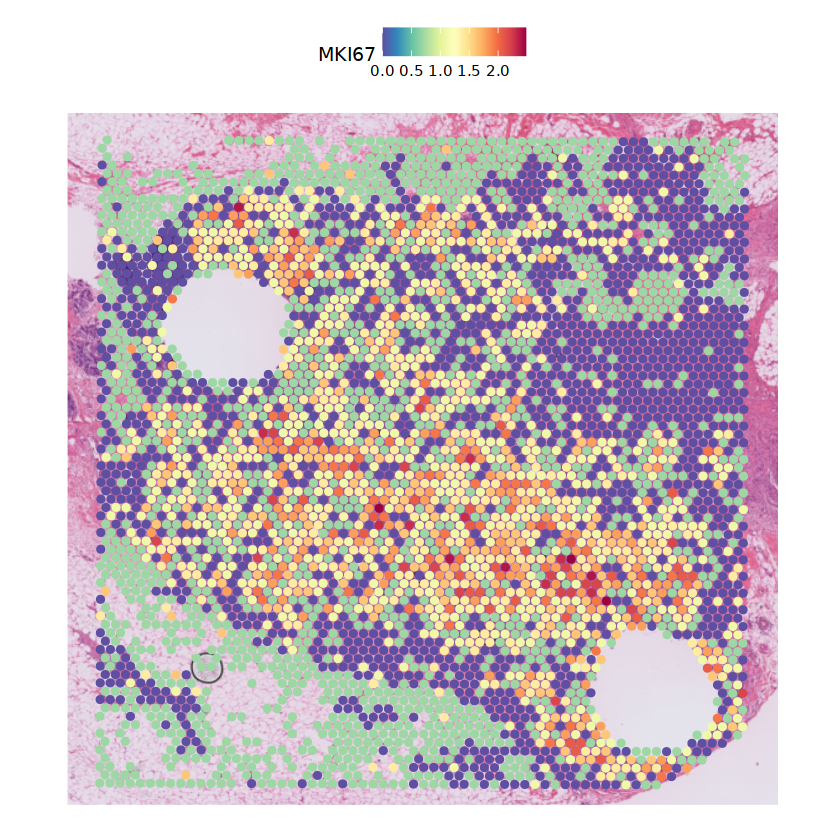

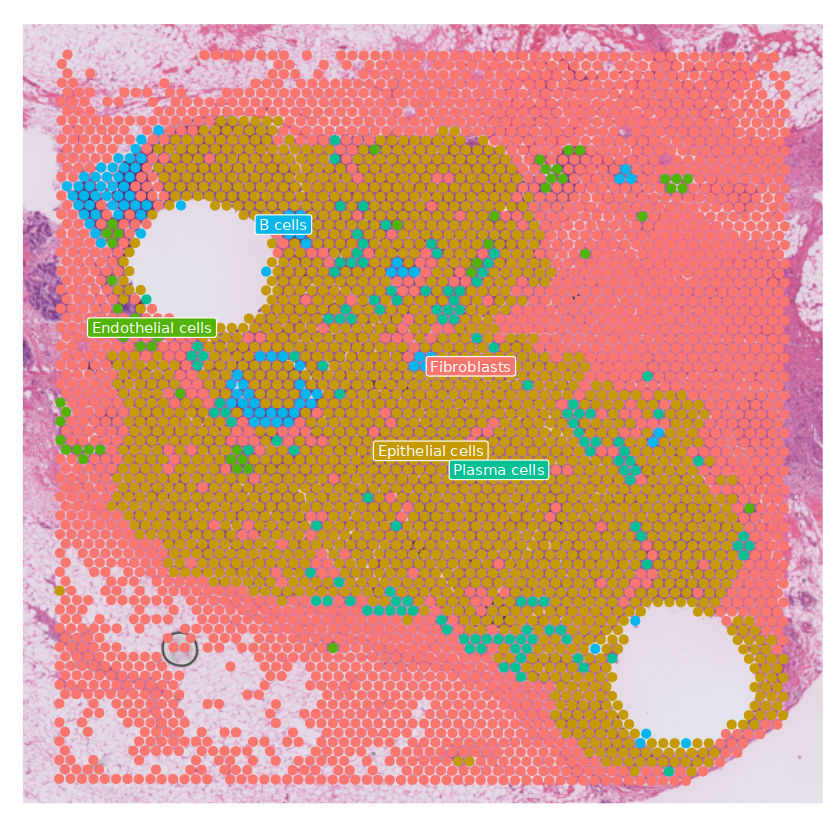

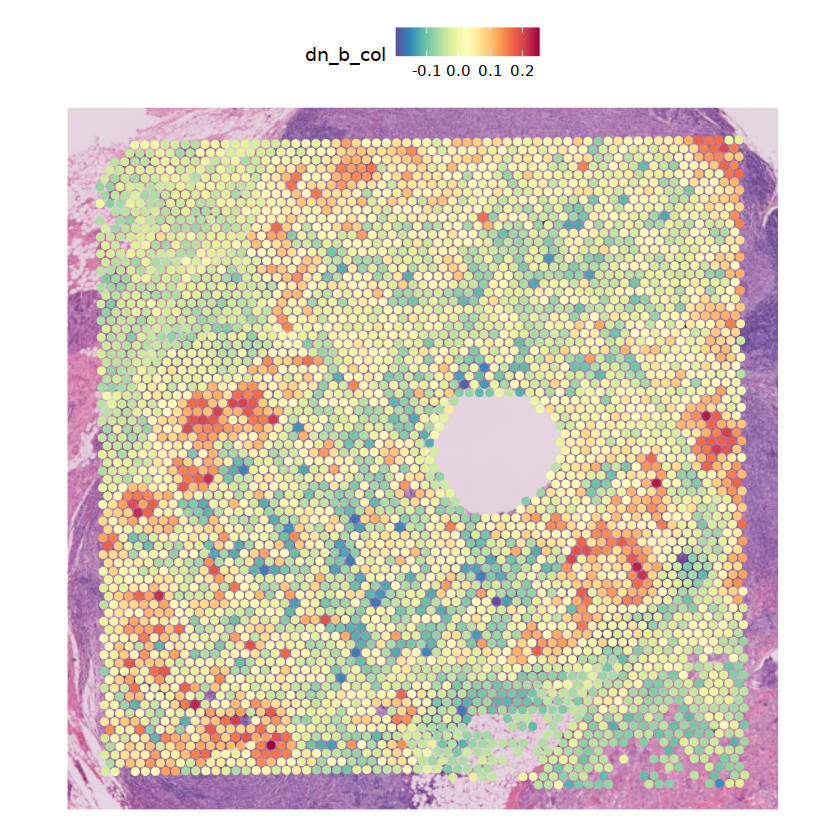

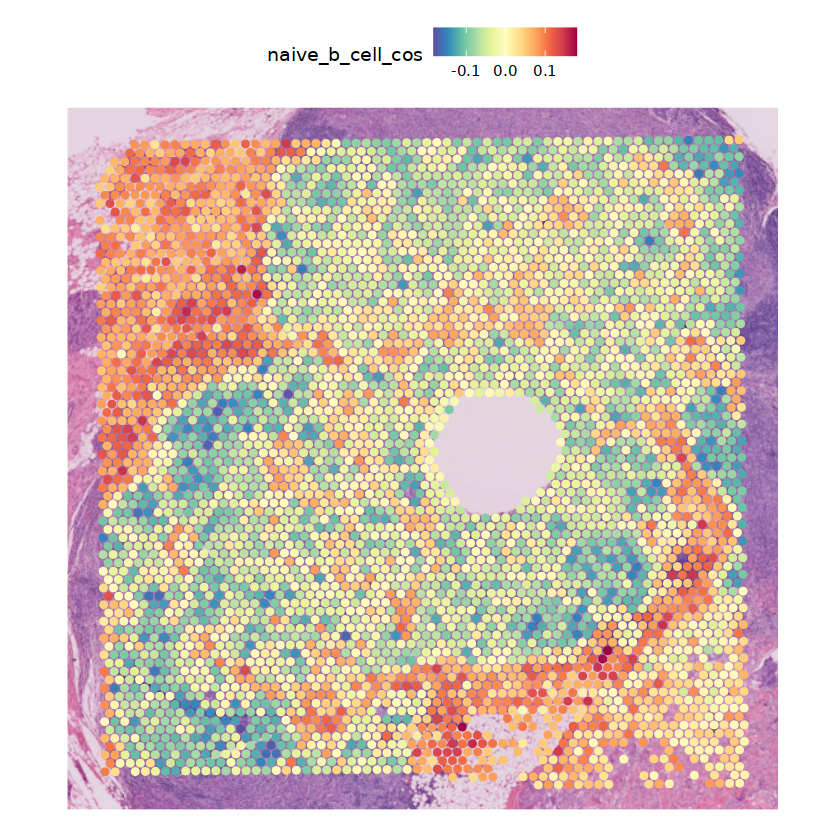

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


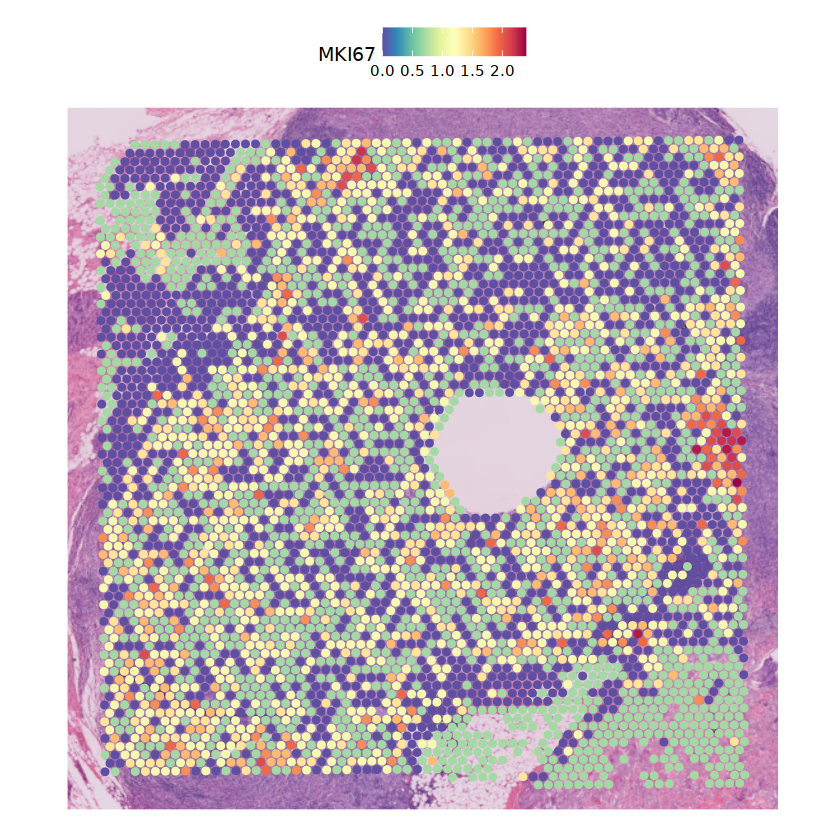

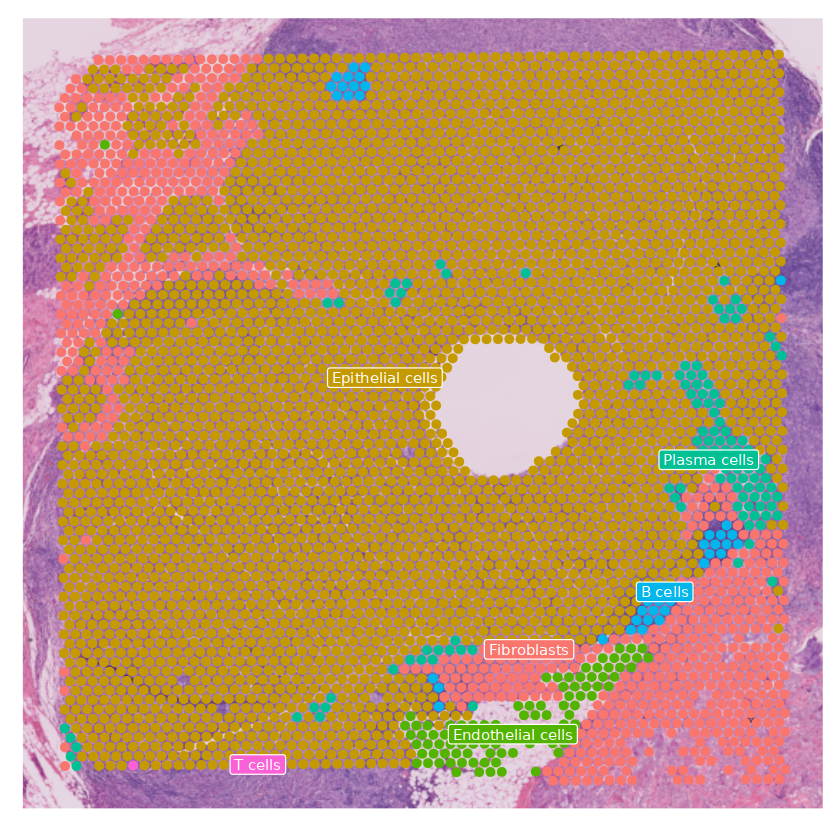

In [344]:
SpatialFeaturePlot(visium_merge, features = 'dn_b_col', images = "slice1")
SpatialFeaturePlot(visium_merge, features = 'naive_b_cell_cos', images = "slice1")
SpatialFeaturePlot(visium_merge, features = 'MKI67', images = "slice1")
Idents(visium_merge) <- 'majority_voting'
SpatialDimPlot(visium_merge, label = TRUE, label.size = 3, images = "slice1") + NoLegend()


SpatialFeaturePlot(visium_merge, features = 'dn_b_col', images = "slice1.6")
SpatialFeaturePlot(visium_merge, features = 'naive_b_cell_cos', images = "slice1.6")
SpatialFeaturePlot(visium_merge, features = 'MKI67', images = "slice1.6")
SpatialDimPlot(visium_merge, label = TRUE, label.size = 3, images = "slice1.6") + NoLegend()

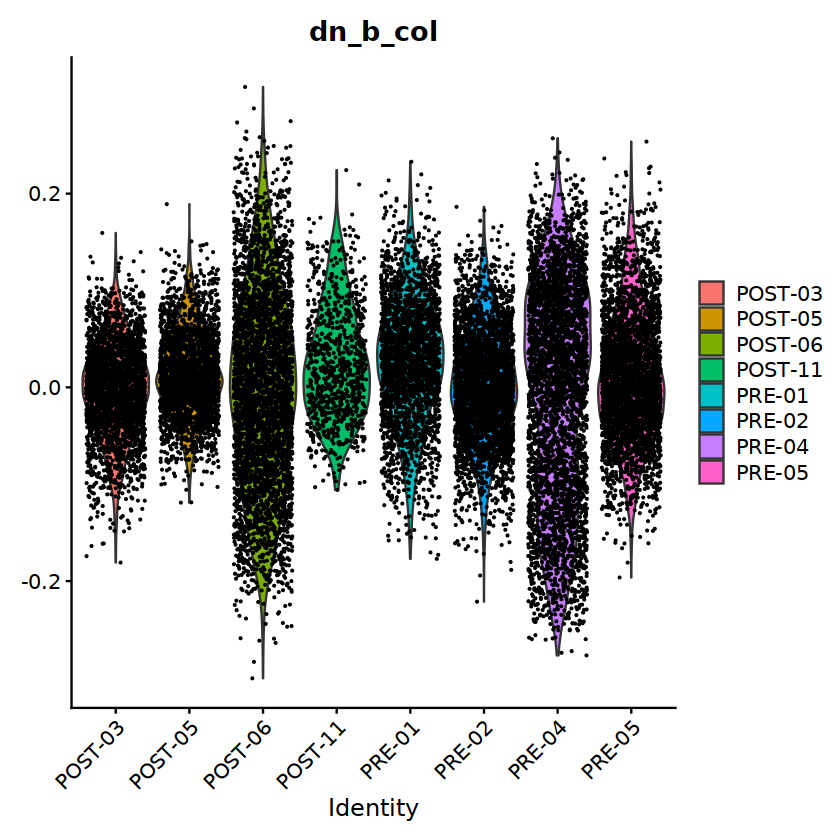

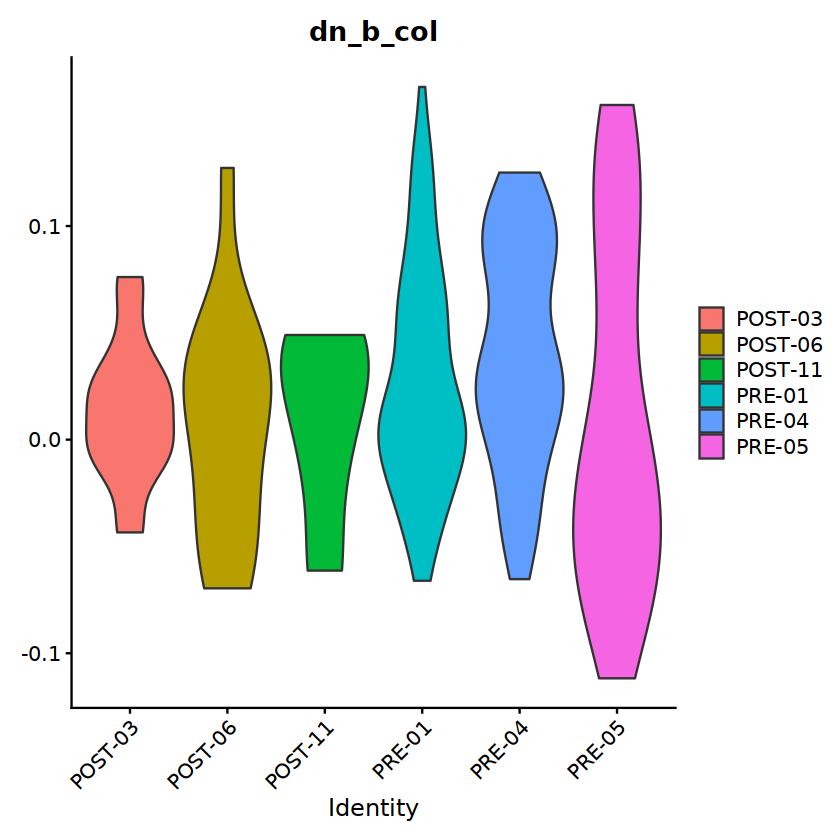

In [346]:
just_b_cells <- subset(visium_merge_tumor, subset = majority_voting == 'B cells')

VlnPlot(visium_merge_tumor, features = 'dn_b_col', group.by = 'sample', pt.size = 0.1)
VlnPlot(just_b_cells, features = 'dn_b_col', group.by = 'sample', pt.size = 0)

In [151]:
unique(visium_merge[[]]$majority_voting)

[1] "Fibroblasts"       "Epithelial cells"  "Endothelial cells"
[4] "Plasma cells"      "B cells"           "Macrophages"      
[7] "T cells"

In [159]:
?SCTransform

SCTransform {Seurat},R Documentation
object,UMI counts matrix
...,Additional parameters passed to sctransform::vst
cell.attr,A metadata with cell attributes
reference.SCT.model,"If not NULL, compute residuals for the object using the provided SCT model; supports only log_umi as the latent variable. If residual.features are not specified, compute for the top variable.features.n specified in the model which are also present in the object. If residual.features are specified, the variable features of the resulting SCT assay are set to the top variable.features.n in the model."
do.correct.umi,Place corrected UMI matrix in assay counts slot; default is TRUE
ncells,Number of subsampling cells used to build NB regression; default is 5000
residual.features,"Genes to calculate residual features for; default is NULL (all genes). If specified, will be set to VariableFeatures of the returned object."
variable.features.n,Use this many features as variable features after ranking by residual variance; default is 3000. Only applied if residual.features is not set.
variable.features.rv.th,"Instead of setting a fixed number of variable features, use this residual variance cutoff; this is only used when variable.features.n is set to NULL; default is 1.3. Only applied if residual.features is not set."
vars.to.regress,Variables to regress out in a second non-regularized linear


ERROR: Error in eval(expr, envir, enclos): object 'Rscript' not found
